## Computer Vision - Licence Plate Detection and Recognition 

## Model YOLO V1 

Célestin GABORIAU, Anaëlle MARTY, Alix MEULOT, Timothée POULY

We used AI (especially Copilot auto completion and Chat GPT) to help us coding. Nevertheless, we understand what is done and we debugged a lot of issues. 

### Plan : 

0. Set up the environnment 
1. Import librairies and definie helper functions 
2. Loading data set and preprocessing 
3. Model definition and tuning : yolo v1 
4. Training the model and evaluation 
5. Results 


### 0. Setup

In this notebook, we will implement a system for detecting and recognizing license plates from images using computer vision techniques.

- The requirement are register in the requirements.txt file.
- To install them, run the following command:
  
  ```bash
  pip install -r requirements.txt
  ```


"We provide the trained model weights in the 'models' directory. You can load these weights into your model for inference or further training."


### 1. Importing Libraries and Defining Helper Functions

In [1]:
import os
import cv2
import yaml
import shutil
import numpy as np
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from torch.utils.data import Dataset
from PIL import Image
import torch
import sys
# print(torch.cuda.is_available())

from ultralytics import YOLO
sys.path.append("../src")

from utils import pair_split, display_image_with_bboxes, plot_yolo_sample

Check what processor is available on your computer : 

CPU : If you have only a CPU, you should use the dataset_small1. The model training and results are going to run a long time (around 1 hour for one model). 

GPU : You can use both of the dataset to run the models. 

In [2]:
if torch.cuda.is_available():
    print("✅ GPU détecté !")
    print(f"Nom du GPU : {torch.cuda.get_device_name(0)}")
    print(f"Mémoire disponible : {torch.cuda.get_memory_info(0).total / 1e9:.2f} GB")
else:
    print("❌ Aucun GPU détecté (ou pilotes CUDA non installés).")

❌ Aucun GPU détecté (ou pilotes CUDA non installés).


Personal note : To define the model and run them, we used our own computer. We train the model with the dataset_small1. 

### 2. Loading Dataset and Preprocessing

#### Optional - download a reduced "dataset_small1 " :

Reduce the dataset - using CPU device: 

In [3]:
# --- CONFIGURATION DES CHEMINS ---
# On définit la racine du projet (un niveau au-dessus du dossier 'notebooks')
# Cela permet d'accéder à /data et /src facilement
PROJECT_ROOT = os.path.abspath(os.path.join(os.getcwd(), ".."))
PATH_SOURCE = os.path.join(PROJECT_ROOT, "data") 
PATH_SMALL = os.path.join(PROJECT_ROOT, "dataset_small1")

print(f"🏠 Racine du projet : {PROJECT_ROOT}")
print(f"📂 Source des données : {PATH_SOURCE}")

# Vérification immédiate
if not os.path.exists(PATH_SOURCE):
    print("❌ Erreur : Le dossier 'data' est introuvable à la racine. Vérifie l'arborescence.")
else:
    print("✅ Dossier 'data' détecté.")

🏠 Racine du projet : c:\Users\timpo\OneDrive\Bureau\ICVIS_project
📂 Source des données : c:\Users\timpo\OneDrive\Bureau\ICVIS_project\data
❌ Erreur : Le dossier 'data' est introuvable à la racine. Vérifie l'arborescence.


## DO NOT LAUNCH THE FOLLOWING CELL IF YOU ALREADY HAVE dataset_small1 !

In [5]:
#Creation du dataset_small1: 
import random
def setup_local_dataset(source, target, n_train=800, n_val=150, n_test=50):
    if os.path.exists(target):
        shutil.rmtree(target)
    
    splits = {'train': n_train, 'val': n_val, 'test': n_test}
    
    for split, count in splits.items():
        img_out = os.path.join(target, 'images', split)
        lab_out = os.path.join(target, 'labels', split)
        os.makedirs(img_out, exist_ok=True)
        os.makedirs(lab_out, exist_ok=True)
        
        # On cherche dans /data/images/train, etc.
        img_src_dir = os.path.join(source, 'images', split)
        lab_src_dir = os.path.join(source, 'labels', split)
        
        if not os.path.exists(img_src_dir):
            print(f"⚠️ Dossier {split} introuvable dans {source}")
            continue

        all_imgs = [f for f in os.listdir(img_src_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
        valid_imgs = [i for i in all_imgs if os.path.exists(os.path.join(lab_src_dir, os.path.splitext(i)[0] + ".txt"))]
        
        selected = random.sample(valid_imgs, min(count, len(valid_imgs)))
        
        for img_name in selected:
            shutil.copy(os.path.join(img_src_dir, img_name), os.path.join(img_out, img_name))
            shutil.copy(os.path.join(lab_src_dir, os.path.splitext(img_name)[0] + ".txt"), 
                        os.path.join(lab_out, os.path.splitext(img_name)[0] + ".txt"))
    
    print(f"✅ Dataset réduit créé : {target}")

setup_local_dataset(PATH_SOURCE, PATH_SMALL)

✅ Dataset réduit créé : c:\Users\anael\Desktop\Projet 3A\ICVIS_project\dataset_small1


#### 2.0 Define path variables

In [4]:
# Grand dataset 
#image_dir = "../data/images"
#label_dir = "../data/labels"

#petit dataset 
image_dir = "../dataset_small1/images"
label_dir = "../dataset_small1/labels"

#### 2.1 Define a function to pair images and labels

In [5]:
train_pairs = pair_split(image_dir+"/train", label_dir+"/train")
val_pairs   = pair_split(image_dir+"/val", label_dir+"/val")
test_pairs  = pair_split(image_dir+"/test", label_dir+"/test")

#### 2.2 Convert into normalized dataset

In [6]:
import os
from PIL import Image

def process_pairs_to_normalized_dataset(pairs):
    dataset_list = []

    for img_path, label_path in pairs:
        # Charger l'image
        try:
            img_pil = Image.open(img_path).convert("RGB")
        except FileNotFoundError:
            continue

        bboxes = []
        class_ids = []

        # Lire le fichier label YOLO (format: class xc yc w h)
        if os.path.exists(label_path):
            with open(label_path, "r") as f:
                for line in f:
                    parts = line.strip().split()
                    if not parts: continue
                    
                    c, xc, yc, w, h = map(float, parts)
                    
                    # On garde les valeurs telles quelles (normalisées)
                    bboxes.append([xc, yc, w, h])
                    class_ids.append(int(c))
        
        dataset_list.append((img_pil, bboxes, class_ids))

    return dataset_list



In [7]:
train_dataset = process_pairs_to_normalized_dataset(train_pairs)
val_dataset   = process_pairs_to_normalized_dataset(val_pairs)
test_dataset  = process_pairs_to_normalized_dataset(test_pairs)

#### 2.3 Transorm into PyTorch Dataset (YOLO format)

In [ ]:
class YoloDataset(Dataset):
    def __init__(self, dataset_source, transform, S=13):
        self.dataset = dataset_source # Liste de (img_path, label_path)
        self.transform = transform
        self.S = S

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        # 1. On déballe les deux chemins (Solution structurelle)
        img_path, label_path, *rest = self.dataset[idx]

        # 2. Chargement réel de l'image (Lazy Loading)
        img = Image.open(img_path).convert("RGB")
        
        # 3. Application des transformations (Resize + ToTensor/Normalization)
        if self.transform:
            img = self.transform(img)

        # 4. Chargement et traitement des labels
        label_matrix = torch.zeros((self.S, self.S, 6))
        if os.path.exists(label_path):
            with open(label_path, "r") as f:
                for line in f:
                    parts = list(map(float, line.strip().split()))
                    if not parts: continue
                    
                    # YOLO format: class xc yc w h
                    class_id, xc, yc, w, h = parts
                    
                    i, j = int(yc * self.S), int(xc * self.S)
                    if label_matrix[i, j, 4] == 0:
                        label_matrix[i, j, 4] = 1.0 # Confiance
                        label_matrix[i, j, 0:4] = torch.tensor([xc * self.S - j, yc * self.S - i, w, h])
                        label_matrix[i, j, 5] = class_id
        
        # ON RENVOIE EXACTEMENT 2 VALEURS : l'image et la matrice
        return img, label_matrix

In [9]:
import torchvision.transforms as transforms

# Définissez une taille standard (YOLO utilise souvent 416 ou 640)
IMAGE_SIZE = 416 

my_transforms = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)), # Redimensionne TOUTES les images
    transforms.ToTensor(),                        # Convertit en [0, 1]
])

# Appliquez ces transformations à vos datasets
train_ds = YoloDataset(train_pairs, transform=my_transforms, S=13)
val_ds   = YoloDataset(val_pairs,   transform=my_transforms, S=13)
test_ds  = YoloDataset(test_pairs,  transform=my_transforms, S=13)

#### 2.4 Visualizing an example from the dataset

Image tensor shape: torch.Size([3, 416, 416])
Label matrix shape: torch.Size([13, 13, 6])


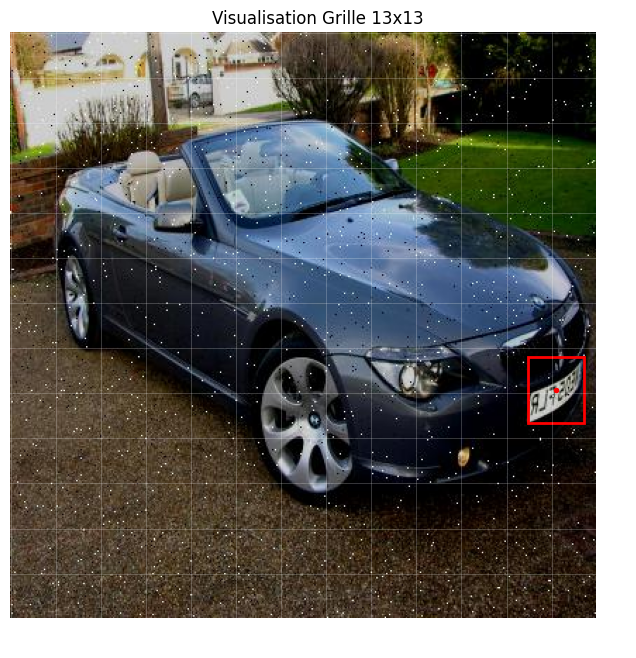

In [10]:
img, label = train_ds[10] 
print("Image tensor shape:", img.shape)
print("Label matrix shape:", label.shape)
plot_yolo_sample(img, label, S=13)

In [11]:
from torch.utils.data import DataLoader # a importer en début de notebook
train_loader = DataLoader(train_ds, batch_size=64, shuffle=True)
val_loader = DataLoader(val_ds, batch_size=64, shuffle=False)
test_loader = DataLoader(test_ds, batch_size=64, shuffle=False)

### 3. Model Definition

#### 3.1 Yolo v1 

In [12]:
# Define the YOLOv1 model and it architecture
import torch
import torch.nn as nn
import torch.nn.functional as F

class YOLOv1(nn.Module):
    def __init__(self, S=3, C=1):
        super().__init__()
        self.S = S
        self.C = C
        self.out_channels = 5 + C  # (x,y,w,h,obj) + classes

        # ------------------- -------
        # YOLOv1 Backbone (Deep)
        # --------------------------
        self.features = nn.Sequential(
            # --------- Layer Group 1 ---------
            nn.Conv2d(3, 64, kernel_size=7, stride=2, padding=3),
            nn.LeakyReLU(0.1),
            nn.MaxPool2d(2, 2),

            # --------- Group 2 ---------
            nn.Conv2d(64, 192, kernel_size=3, padding=1),
            nn.LeakyReLU(0.1),
            nn.MaxPool2d(2, 2),

            # --------- Group 3 ---------
            nn.Conv2d(192, 128, kernel_size=1),
            nn.LeakyReLU(0.1),
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.LeakyReLU(0.1),
            nn.Conv2d(256, 256, kernel_size=1),
            nn.LeakyReLU(0.1),
            nn.Conv2d(256, 512, kernel_size=3, padding=1),
            nn.LeakyReLU(0.1),
            nn.MaxPool2d(2, 2),

            # --------- 4× Repeated Block ---------
            *[
                nn.Sequential(
                    nn.Conv2d(512, 256, kernel_size=1),
                    nn.LeakyReLU(0.1),
                    nn.Conv2d(256, 512, kernel_size=3, padding=1),
                    nn.LeakyReLU(0.1)
                ) for _ in range(4)
            ],

            nn.Conv2d(512, 512, kernel_size=1),
            nn.LeakyReLU(0.1),
            nn.Conv2d(512, 1024, kernel_size=3, padding=1),
            nn.LeakyReLU(0.1),
            nn.MaxPool2d(2, 2),

            # --------- Final Block ---------
            nn.Conv2d(1024, 512, kernel_size=1),
            nn.LeakyReLU(0.1),
            nn.Conv2d(512, 1024, kernel_size=3, padding=1),
            nn.LeakyReLU(0.1),
            nn.Conv2d(1024, 512, kernel_size=1),
            nn.LeakyReLU(0.1),
            nn.Conv2d(512, 1024, kernel_size=3, padding=1),
            nn.LeakyReLU(0.1),
        )

        # --------------------------
        # YOLOv1 Head (Simplified)
        # --------------------------
        self.pred_head = nn.Sequential(
            nn.Conv2d(1024, 1024, kernel_size=3, padding=1),
            nn.LeakyReLU(0.1),
            nn.Conv2d(1024, self.out_channels, kernel_size=1)
        )

    def forward(self, x):
        x = self.features(x)          # TO DO
        x = self.pred_head(x)         # TO DO
        x = x.permute(0, 2, 3, 1) 
        print(x.shape)    # TO DO
        return x


In [13]:
test = YOLOv1(S=7, C=1)
print(test)

YOLOv1(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3))
    (1): LeakyReLU(negative_slope=0.1)
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): LeakyReLU(negative_slope=0.1)
    (5): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 128, kernel_size=(1, 1), stride=(1, 1))
    (7): LeakyReLU(negative_slope=0.1)
    (8): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): LeakyReLU(negative_slope=0.1)
    (10): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (11): LeakyReLU(negative_slope=0.1)
    (12): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): LeakyReLU(negative_slope=0.1)
    (14): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (15): Sequential(
      (0): Conv2d(512, 256,

In [14]:
from torchinfo import summary
summary(test, input_size=(3,3, 768, 1024))

torch.Size([3, 24, 32, 6])


Layer (type:depth-idx)                   Output Shape              Param #
YOLOv1                                   [3, 24, 32, 6]            --
├─Sequential: 1-1                        [3, 1024, 24, 32]         --
│    └─Conv2d: 2-1                       [3, 64, 384, 512]         9,472
│    └─LeakyReLU: 2-2                    [3, 64, 384, 512]         --
│    └─MaxPool2d: 2-3                    [3, 64, 192, 256]         --
│    └─Conv2d: 2-4                       [3, 192, 192, 256]        110,784
│    └─LeakyReLU: 2-5                    [3, 192, 192, 256]        --
│    └─MaxPool2d: 2-6                    [3, 192, 96, 128]         --
│    └─Conv2d: 2-7                       [3, 128, 96, 128]         24,704
│    └─LeakyReLU: 2-8                    [3, 128, 96, 128]         --
│    └─Conv2d: 2-9                       [3, 256, 96, 128]         295,168
│    └─LeakyReLU: 2-10                   [3, 256, 96, 128]         --
│    └─Conv2d: 2-11                      [3, 256, 96, 128]         6

In [15]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = YOLOv1(S=13, C=1).to(device)

bbox_loss_fn = nn.MSELoss() 
cls_loss_fn = nn.CrossEntropyLoss()  

optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

loss_history = []
acc_history = []


### 4. Training and Evaluation

Model 1 / lambda_coord=5 et lambda noobj=0.5

In [16]:
def yolo_loss(pred, target, lambda_coord=5, lambda_noobj=0.5):

    obj_mask    = target[..., 4] == 1      # mask for grid cells that contain an object
    noobj_mask  = target[..., 4] == 0      # mask for grid cells without an object

    # 1) COORDINATE LOSS ----------------------------------------------------
    loss_xywh = ((pred[...,0:4] - target[...,0:4])**2)[obj_mask].sum()        # L2 loss on (x,y,w,h) only where an object exists

    # 2) OBJECTNESS LOSS ----------------------------------------------------
    obj_pred = torch.sigmoid(pred[...,4])  # apply sigmoid to objectness score

    loss_obj = nn.functional.binary_cross_entropy(obj_pred[obj_mask], target[...,4][obj_mask])         # BCE loss for object cells (want confidence=1)
    loss_noobj = nn.functional.binary_cross_entropy(obj_pred[noobj_mask], target[...,4][noobj_mask])   # BCE loss for no-object cells (want confidence=0)

    # 3) CLASSIFICATION LOSS ------------------------------------------------
    pred_cls = pred[..., 5:]               # predicted class logits
    target_cls = target[..., 5:]           # ground-truth one-hot class labels

    cls_pred = pred_cls[obj_mask]          # keep class logits only for object cells
    cls_true = target_cls[obj_mask]        # keep corresponding GT labels

    if cls_pred.numel() > 0:               # check if there are any object cells
        cls_true = cls_true.argmax(-1)     # convert one-hot labels to class indices
        loss_cls = nn.functional.cross_entropy(cls_pred, cls_true)   # cross-entropy classification loss
    else:
        loss_cls = torch.tensor(0.0, device=pred.device)             # no objects → class loss = 0

    # FINAL LOSS ------------------------------------------------------------
    return (lambda_coord * loss_xywh       # weighted coordinate loss
            + loss_obj                     # objectness loss for object cells
            + lambda_noobj * loss_noobj    # downweighted no-object loss
            + loss_cls)                    # classification loss


In [17]:
def yolo_accuracy(pred, target):
    """
    Computes classification accuracy ONLY for cells containing objects.
    pred: (B,S,S,5+C)
    target: (B,S,S,5+C)
    """
    obj_mask = target[..., 4] == 1  # cells with objects

    if obj_mask.sum() == 0:
        return 0.0

    pred_cls = pred[..., 5:].argmax(-1)     # predicted class index
    true_cls = target[..., 5:].argmax(-1)   # true class index

    correct = (pred_cls[obj_mask] == true_cls[obj_mask]).sum().item()
    total = obj_mask.sum().item()

    return correct / total


The following cell is very long to run, you don't need to launch it if you already have a model ready in the models folder : 

In [18]:
#nouvelle boucle d'entrainement pour avoir accuracy et validation loss
model = YOLOv1().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

loss_history = []
val_loss_history = []
train_acc_history = []
val_acc_history = []

for epoch in range(5):
    # ============================
    # 1. PHASE ENTRAÎNEMENT (Train)
    # ============================
    model.train()
    total_loss, total_acc, total_batches = 0, 0, 0

    for imgs, labels in train_loader:
        imgs, labels = imgs.to(device), labels.to(device)

        optimizer.zero_grad()
        preds = model(imgs)
        loss = yolo_loss(preds, labels)
        loss.backward()
        optimizer.step()

        # Calcul de l'Accuracy (Objectness Accuracy)
        # On regarde si le modèle a bien prédit la présence (indice 4)
        with torch.no_grad():
            # Masque des cellules contenant un objet
            obj_mask = (labels[..., 4] == 1)
            # Prédiction de confiance (après sigmoid) > 0.5
            pred_conf = torch.sigmoid(preds[..., 4])
            correct_obj = (pred_conf[obj_mask] > 0.5).float().sum()
            total_obj = obj_mask.sum()
            
            # Accuracy = % d'objets réels trouvés par le modèle
            batch_acc = (correct_obj / (total_obj + 1e-6)).item()
            total_acc += batch_acc

        total_loss += loss.item()
        total_batches += 1

    avg_train_loss = total_loss / total_batches
    avg_train_acc = total_acc / total_batches
    loss_history.append(avg_train_loss)
    train_acc_history.append(avg_train_acc)

    # ============================
    # 2. PHASE VALIDATION (Val)
    # ============================
    model.eval()
    total_val_loss, total_val_acc, total_val_batches = 0, 0, 0

    with torch.no_grad():
        for imgs_v, labels_v in val_loader:
            imgs_v, labels_v = imgs_v.to(device), labels_v.to(device)
            preds_v = model(imgs_v)
            
            v_loss = yolo_loss(preds_v, labels_v)
            total_val_loss += v_loss.item()
            
            # Accuracy Validation
            obj_mask_v = (labels_v[..., 4] == 1)
            pred_conf_v = torch.sigmoid(preds_v[..., 4])
            correct_obj_v = (pred_conf_v[obj_mask_v] > 0.5).float().sum()
            batch_acc_v = (correct_obj_v / (obj_mask_v.sum() + 1e-6)).item()
            total_val_acc += batch_acc_v
            
            total_val_batches += 1

    avg_val_loss = total_val_loss / total_val_batches
    avg_val_acc = total_val_acc / total_val_batches
    val_loss_history.append(avg_val_loss)
    val_acc_history.append(avg_val_acc)

    print(f"Epoch {epoch+1}: Loss {avg_train_loss:.3f}/{avg_val_loss:.3f} | Acc {avg_train_acc*100:.1f}%/{avg_val_acc*100:.1f}%")

torch.Size([64, 13, 13, 6])
torch.Size([64, 13, 13, 6])
torch.Size([64, 13, 13, 6])
torch.Size([64, 13, 13, 6])
torch.Size([64, 13, 13, 6])
torch.Size([64, 13, 13, 6])
torch.Size([64, 13, 13, 6])
torch.Size([64, 13, 13, 6])
torch.Size([64, 13, 13, 6])
torch.Size([64, 13, 13, 6])
torch.Size([64, 13, 13, 6])
torch.Size([64, 13, 13, 6])
torch.Size([32, 13, 13, 6])
torch.Size([64, 13, 13, 6])
torch.Size([64, 13, 13, 6])
torch.Size([22, 13, 13, 6])
Epoch 1: Loss 119.668/110.254 | Acc 100.0%/100.0%
torch.Size([64, 13, 13, 6])
torch.Size([64, 13, 13, 6])
torch.Size([64, 13, 13, 6])
torch.Size([64, 13, 13, 6])
torch.Size([64, 13, 13, 6])
torch.Size([64, 13, 13, 6])
torch.Size([64, 13, 13, 6])
torch.Size([64, 13, 13, 6])
torch.Size([64, 13, 13, 6])
torch.Size([64, 13, 13, 6])
torch.Size([64, 13, 13, 6])
torch.Size([64, 13, 13, 6])
torch.Size([32, 13, 13, 6])
torch.Size([64, 13, 13, 6])
torch.Size([64, 13, 13, 6])
torch.Size([22, 13, 13, 6])
Epoch 2: Loss 70.387/92.911 | Acc 100.0%/100.0%
torch.

In [23]:
#save the model
input_folder = "models"
torch.save(model.state_dict(), f"{input_folder}/model.pth")

If you already have trained the model, you can run this to gain time :

In [18]:
model = YOLOv1().to(device)
model.load_state_dict(torch.load("models/model.pth"))
model.eval()

YOLOv1(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3))
    (1): LeakyReLU(negative_slope=0.1)
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): LeakyReLU(negative_slope=0.1)
    (5): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 128, kernel_size=(1, 1), stride=(1, 1))
    (7): LeakyReLU(negative_slope=0.1)
    (8): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): LeakyReLU(negative_slope=0.1)
    (10): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (11): LeakyReLU(negative_slope=0.1)
    (12): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): LeakyReLU(negative_slope=0.1)
    (14): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (15): Sequential(
      (0): Conv2d(512, 256,

### 5. Reading Parts

#### Evolution of Loss and accuracy during the epochs: 

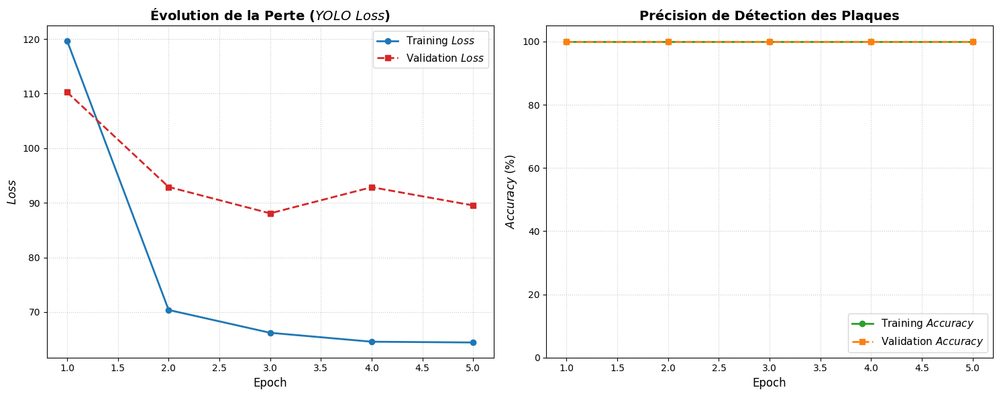

In [25]:
import matplotlib.pyplot as plt

# Configuration du style
plt.figure(figsize=(15, 6))

# --- GRAPHIQUE 1 : LOSS (Erreur) ---
plt.subplot(1, 2, 1)
plt.plot(range(1, len(loss_history) + 1), loss_history, 
         label='Training $Loss$', color='#1f77b4', marker='o', linewidth=2)
plt.plot(range(1, len(val_loss_history) + 1), val_loss_history, 
         label='Validation $Loss$', color='#d62728', marker='s', linestyle='--', linewidth=2)

plt.title("Évolution de la Perte ($YOLO$ $Loss$)", fontsize=14, fontweight='bold')
plt.xlabel("Epoch", fontsize=12)
plt.ylabel("$Loss$", fontsize=12)
plt.legend(fontsize=11)
plt.grid(True, linestyle=':', alpha=0.7)

# --- GRAPHIQUE 2 : ACCURACY (Précision de détection) ---
plt.subplot(1, 2, 2)
plt.plot(range(1, len(train_acc_history) + 1), [a * 100 for a in train_acc_history], 
         label='Training $Accuracy$', color='#2ca02c', marker='o', linewidth=2)
plt.plot(range(1, len(val_acc_history) + 1), [a * 100 for a in val_acc_history], 
         label='Validation $Accuracy$', color='#ff7f0e', marker='s', linestyle='--', linewidth=2)

plt.title("Précision de Détection des Plaques", fontsize=14, fontweight='bold')
plt.xlabel("Epoch", fontsize=12)
plt.ylabel("$Accuracy$ (%)", fontsize=12)
plt.ylim(0, 105) # Pour bien voir la progression jusqu'à 100%
plt.legend(fontsize=11, loc='lower right')
plt.grid(True, linestyle=':', alpha=0.7)

plt.tight_layout()

# Sauvegarde pour tes slides
plt.savefig("courbes_apprentissage_yolo.png", dpi=300)
plt.show()

#### Confusion matrix : 

torch.Size([1, 13, 13, 6])


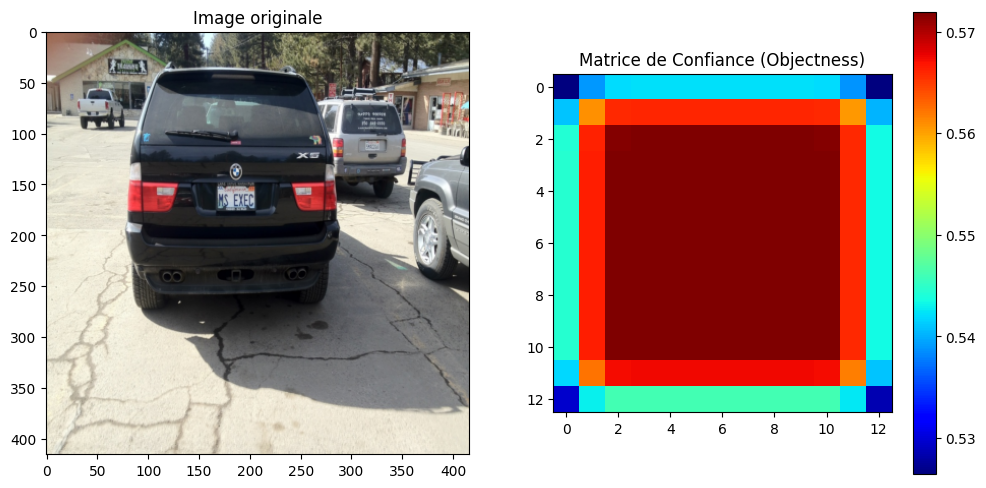

In [19]:
# Visualisation de la matrice de confiance (objectness) pour une image du dataset de validation

def plot_confidence_heatmap(model, dataset, idx=0):
    model.eval()
    img, target = dataset[idx]
    
    # Prédiction (on ajoute une dimension batch et on envoie sur le bon device)
    with torch.no_grad():
        prediction = model(img.unsqueeze(0).to(device))
    
    # On récupère le score d'objectness (canal 4) et on applique sigmoid
    # La forme est (1, 13, 13, 6) -> on veut (13, 13)
    conf_map = torch.sigmoid(prediction[0, ..., 4]).cpu().numpy()

    fig, ax = plt.subplots(1, 2, figsize=(12, 6))
    
    # Image originale
    ax[0].imshow(img.permute(1, 2, 0))
    ax[0].set_title("Image originale")
    
    # Heatmap
    im = ax[1].imshow(conf_map, cmap='jet')
    ax[1].set_title("Matrice de Confiance (Objectness)")
    plt.colorbar(im, ax=ax[1])
    plt.show()

# Utilisation
plot_confidence_heatmap(model, val_ds, idx=1)

To evaluate our YOLOv1 model, we use a two-step approach:

> Quantitative Evaluation: We use the iou function to calculate the mean Intersection over Union (mIoU) on the test set. This tells us how precisely the bounding boxes are placed.

> Qualitative Evaluation: We use show_results to visualize the predictions. This helps identify common failure cases (e.g., partial occlusions or lighting conditions).

> Post-Processing: The apply_nms function is critical here to ensure we only evaluate the most confident prediction per object.

torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])


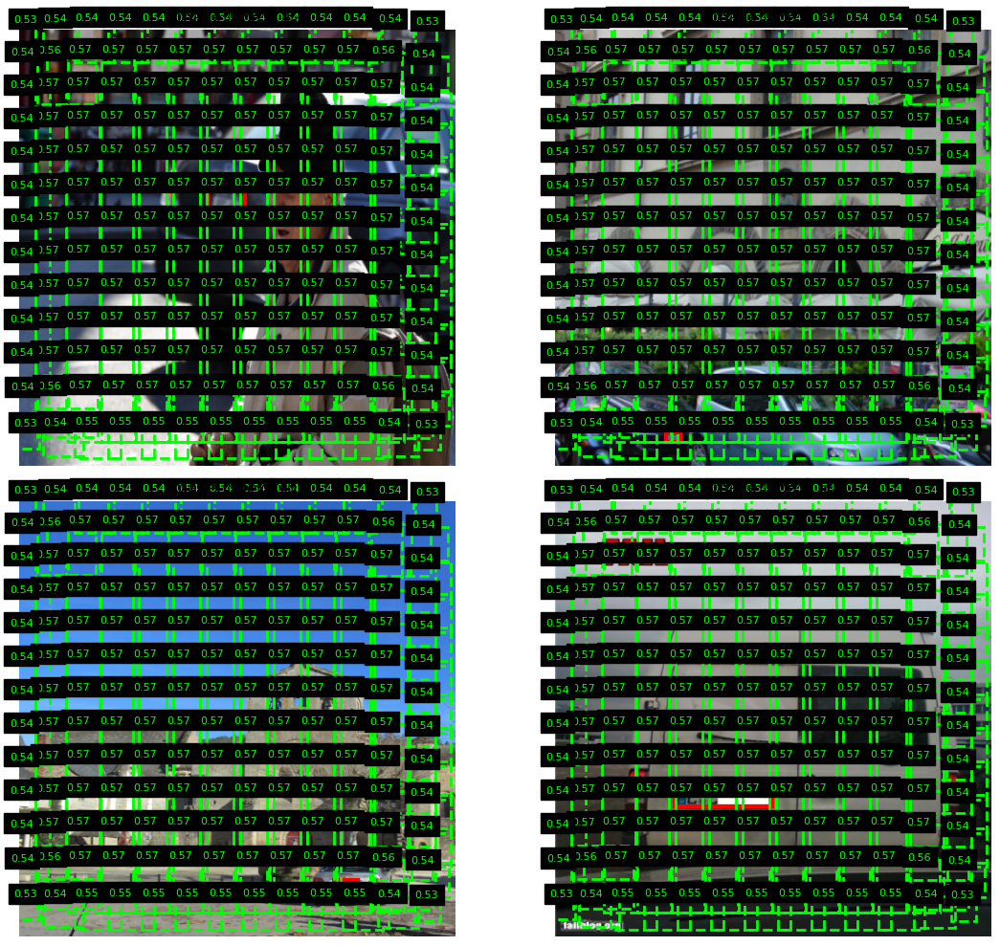

In [20]:
import torch
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import random

# 1. PARAMETRES (A vérifier selon ton code)
S_GRID = 13
IMG_SIZE = 416
id_to_name = {0: "Plaque"} # Ajuste si ton label commence à 1

# ==========================================
# 2. FONCTIONS DE CALCUL (IoU & NMS)
# ==========================================
def iou(box1, box2):
    # box format: [x_center, y_center, w, h] (normalized 0-1)
    x1, y1, w1, h1 = box1
    x2, y2, w2, h2 = box2

    x1a, y1a = x1 - w1/2, y1 - h1/2
    x1b, y1b = x1 + w1/2, y1 + h1/2
    x2a, y2a = x2 - w2/2, y2 - h2/2
    x2b, y2b = x2 + w2/2, y2 + h2/2

    xi1, yi1 = max(x1a, x2a), max(y1a, y2a)
    xi2, yi2 = min(x1b, x2b), min(y1b, y2b)
    
    inter = max(0, xi2 - xi1) * max(0, yi2 - yi1)
    union = (w1 * h1) + (w2 * h2) - inter
    return inter / (union + 1e-6)

def apply_nms(boxes, scores, iou_thresh=0.45):
    if len(boxes) == 0: return []
    
    # Tri par score de confiance
    idxs = scores.argsort(descending=True)
    keep = []
    
    while len(idxs) > 0:
        curr = idxs[0].item()
        keep.append(curr)
        if len(idxs) == 1: break
        
        # On ne garde que les boites dont l'IoU avec la boite actuelle est faible
        rem_idxs = idxs[1:]
        ious = torch.tensor([iou(boxes[curr], boxes[i.item()]) for i in rem_idxs])
        mask = ious < iou_thresh
        idxs = rem_idxs[mask]
        
    return keep

# ==========================================
# 3. DECODAGE DE LA GRILLE (Le secret du placement)
# ==========================================
def decode_yolo_grid(tensor, S=13, is_target=False):
    """ Convertit la grille (S,S,6) en liste de boites globales (0-1) """
    boxes, scores, classes = [], [], []
    
    for i in range(S):     # i = Ligne (Y)
        for j in range(S): # j = Colonne (X)
            cell = tensor[i, j]
            conf = cell[4] if is_target else torch.sigmoid(cell[4])
            
            if conf > 0.1: # Seuil bas pour le debug
                px, py, pw, ph = cell[0:4]
                
                # LA FORMULE CORRECTE :
                gx = (j + px) / S
                gy = (i + py) / S
                
                boxes.append([gx.item(), gy.item(), pw.item(), ph.item()])
                scores.append(conf.item())
                classes.append(int(cell[5].item()))
                
    return torch.tensor(boxes), torch.tensor(scores), torch.tensor(classes)

# ==========================================
# 4. FONCTION DE VISUALISATION FINALE
# ==========================================
def show_results(dataset, model, num_images=4, conf_thresh=0.3):
    model.eval()
    indices = random.sample(range(len(dataset)), num_images)
    
    rows = (num_images + 1) // 2
    fig, axes = plt.subplots(rows, 2, figsize=(12, rows*5))
    axes = axes.flatten()

    for ax, idx in zip(axes, indices):
        img, target = dataset[idx]
        
        # --- TRAITEMENT VÉRITÉ (ROUGE) ---
        gt_boxes, gt_scores, gt_classes = decode_yolo_grid(target, S=S_GRID, is_target=True)

        # --- TRAITEMENT PRÉDICTION (VERT) ---
        with torch.no_grad():
            pred = model(img.unsqueeze(0).to(device))[0].cpu()
        p_boxes, p_scores, p_classes = decode_yolo_grid(pred, S=S_GRID, is_target=False)
        
        # Application du NMS sur les prédictions
        if len(p_boxes) > 0:
            mask = p_scores > conf_thresh
            p_boxes, p_scores, p_classes = p_boxes[mask], p_scores[mask], p_classes[mask]
            keep = apply_nms(p_boxes, p_scores)
            p_boxes, p_scores, p_classes = p_boxes[keep], p_scores[keep], p_classes[keep]

        # --- DESSIN ---
        ax.imshow(img.permute(1, 2, 0).numpy())
        ax.set_title(f"Image Index: {idx}")
        
        # Dessin GT (Rouge)
        for box in gt_boxes:
            x, y, w, h = box
            # x, y est le centre -> conversion corner pour Rectangle()
            ax.add_patch(patches.Rectangle(((x-w/2)*IMG_SIZE, (y-h/2)*IMG_SIZE), 
                                           w*IMG_SIZE, h*IMG_SIZE, 
                                           edgecolor='red', linewidth=3, fill=False))
        
        # Dessin Pred (Vert Lime)
        for box, sc in zip(p_boxes, p_scores):
            x, y, w, h = box
            ax.add_patch(patches.Rectangle(((x-w/2)*IMG_SIZE, (y-h/2)*IMG_SIZE), 
                                           w*IMG_SIZE, h*IMG_SIZE, 
                                           edgecolor='lime', linewidth=2, fill=False, linestyle='--'))
            ax.text((x-w/2)*IMG_SIZE, (y-h/2)*IMG_SIZE, f"{sc:.2f}", color='lime', fontsize=8, backgroundcolor='black')

        ax.axis('off')
    
    plt.tight_layout()
    plt.show()

# LANCEMENT
show_results(val_ds, model, num_images=4, conf_thresh=0.3)

Comments : 

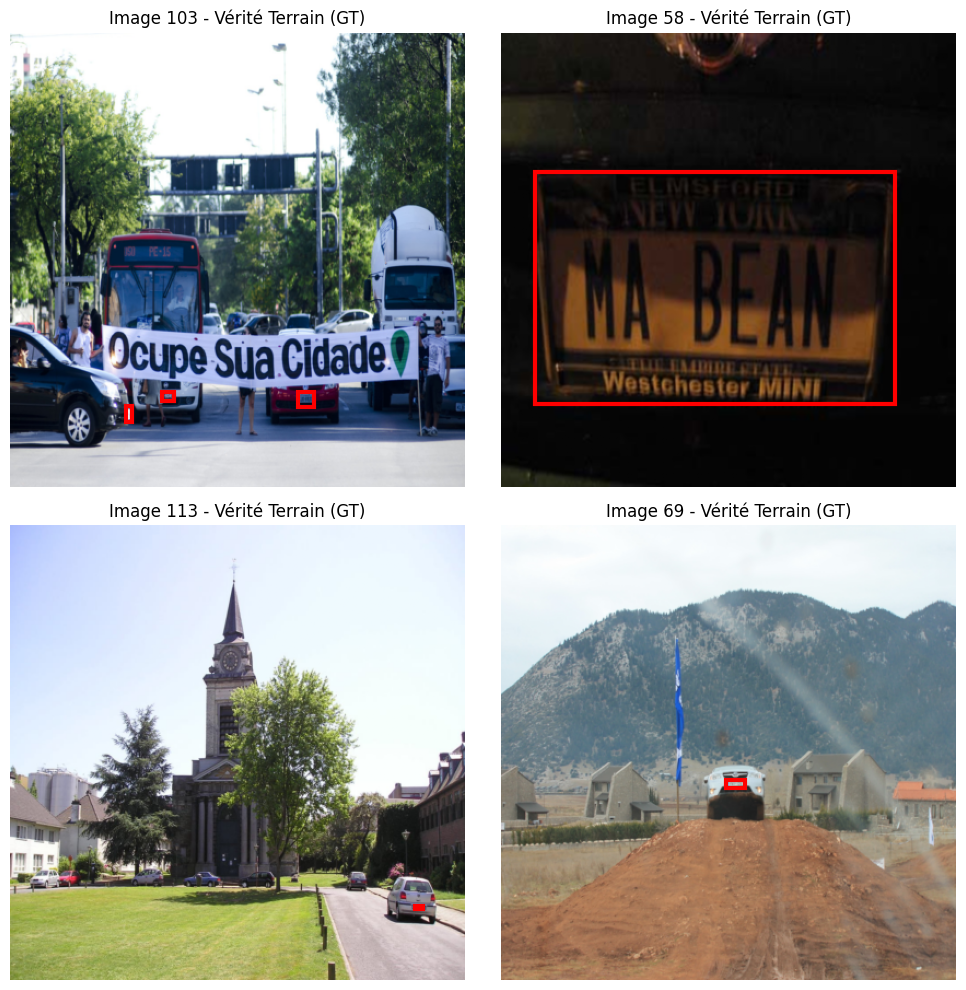

In [21]:
import torch
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import random

def show_gt_only(dataset, num_images=4):
    """
    Affiche les images du dataset avec UNIQUEMENT les boîtes rouges (Vérité Terrain).
    """
    # Sélection d'indices aléatoires
    indices = random.sample(range(len(dataset)), min(num_images, len(dataset)))
    
    rows = (num_images + 1) // 2
    fig, axes = plt.subplots(rows, 2, figsize=(10, rows*5))
    axes = axes.flatten()

    for ax, idx in zip(axes, indices):
        img, target = dataset[idx]
        
        # On utilise ta fonction de décodage avec is_target=True
        # Si tu n'as pas gardé la fonction précédente, je l'ai incluse en bas
        gt_boxes, _, _ = decode_yolo_grid(target, S=13, is_target=True)

        # Affichage de l'image
        # img est souvent (3, 416, 416), on le passe en (416, 416, 3) pour matplotlib
        ax.imshow(img.permute(1, 2, 0).cpu().numpy())
        ax.set_title(f"Image {idx} - Vérité Terrain (GT)")
        
        # Dessin des carrés rouges
        for box in gt_boxes:
            x, y, w, h = box
            # x,y est le centre (0-1), on convertit en pixels et en coin haut-gauche
            x0 = (x - w/2) * 416
            y0 = (y - h/2) * 416
            w0 = w * 416
            h0 = h * 416
            
            rect = patches.Rectangle((x0, y0), w0, h0, linewidth=3, edgecolor='red', facecolor='none')
            ax.add_patch(rect)
            
        ax.axis('off')

    plt.tight_layout()
    plt.show()

# --- Rappel de la fonction de décodage nécessaire ---
def decode_yolo_grid(tensor, S=13, is_target=True):
    boxes, scores, classes = [], [], []
    for i in range(S):
        for j in range(S):
            cell = tensor[i, j]
            conf = cell[4].item()
            if conf > 0.9: # Seuil strict pour la vérité terrain
                px, py, pw, ph = cell[0:4]
                gx, gy = (j + px) / S, (i + py) / S
                boxes.append([gx.item(), gy.item(), pw.item(), ph.item()])
                scores.append(conf)
                classes.append(int(cell[5].item()))
    return torch.tensor(boxes), torch.tensor(scores), torch.tensor(classes)


show_gt_only(val_ds, num_images=4)

Comments : 

#### Tuning post treatment :

Test avec Conf=0.1 et NMS=0.2
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])


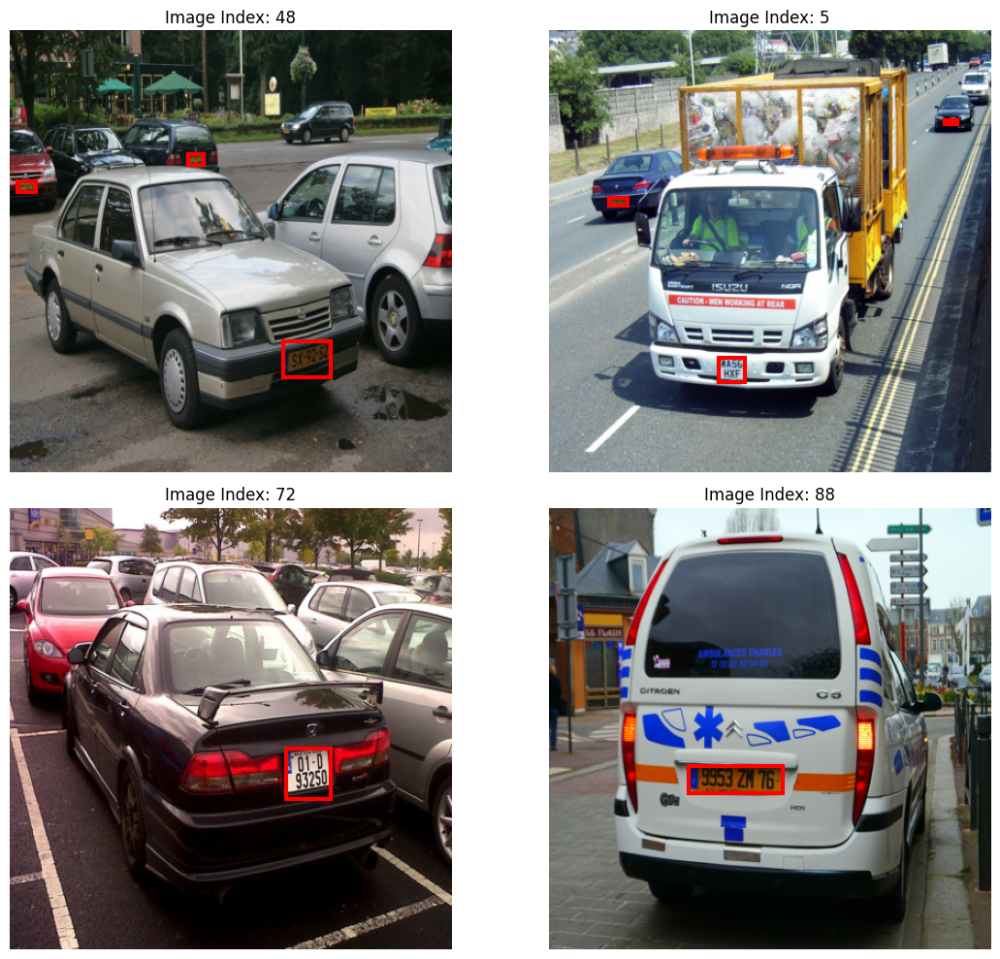

Test avec Conf=0.1 et NMS=0.45
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])


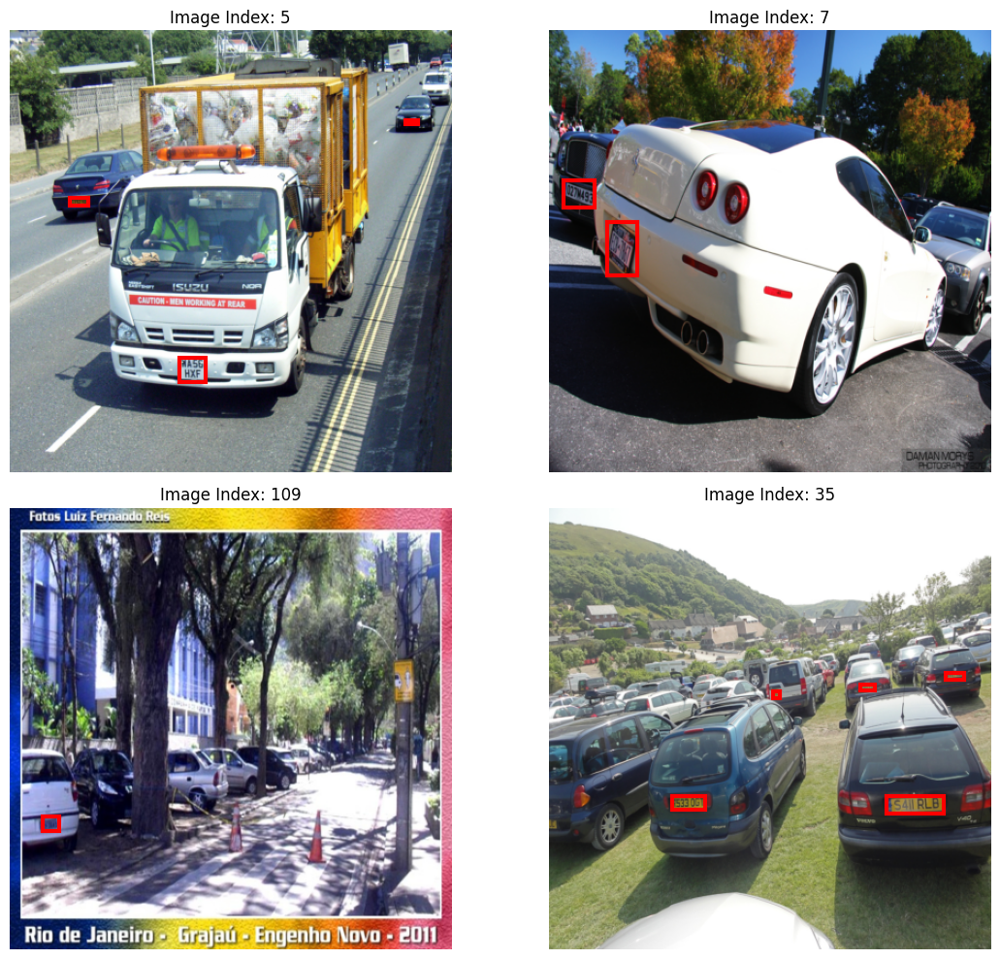

Test avec Conf=0.1 et NMS=0.6
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])


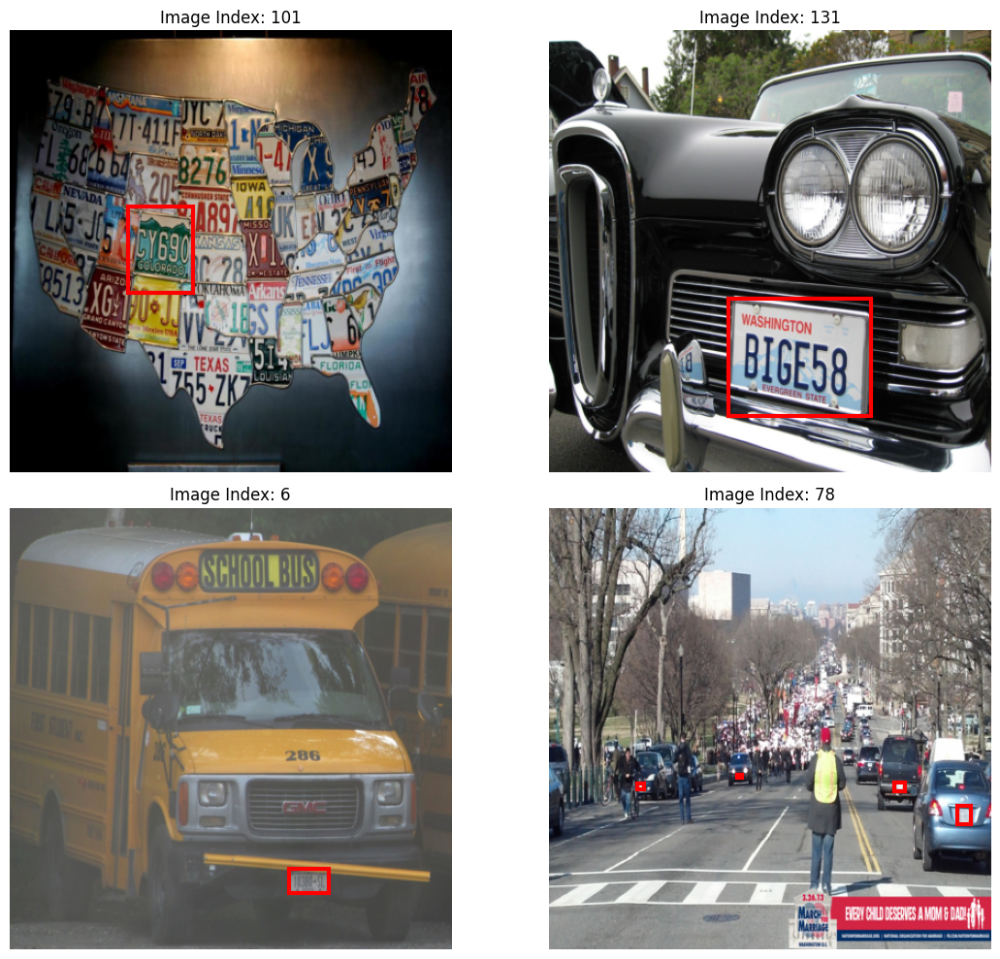

Test avec Conf=0.3 et NMS=0.2
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])


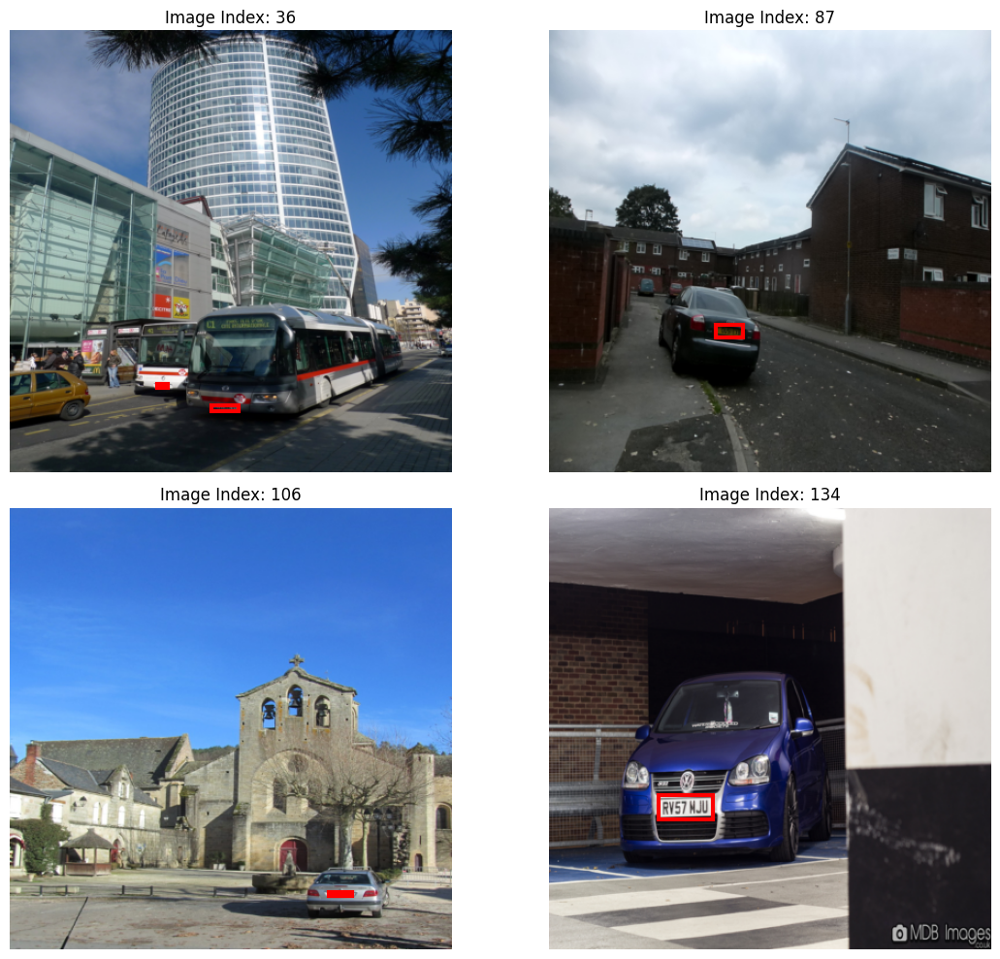

Test avec Conf=0.3 et NMS=0.45
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])


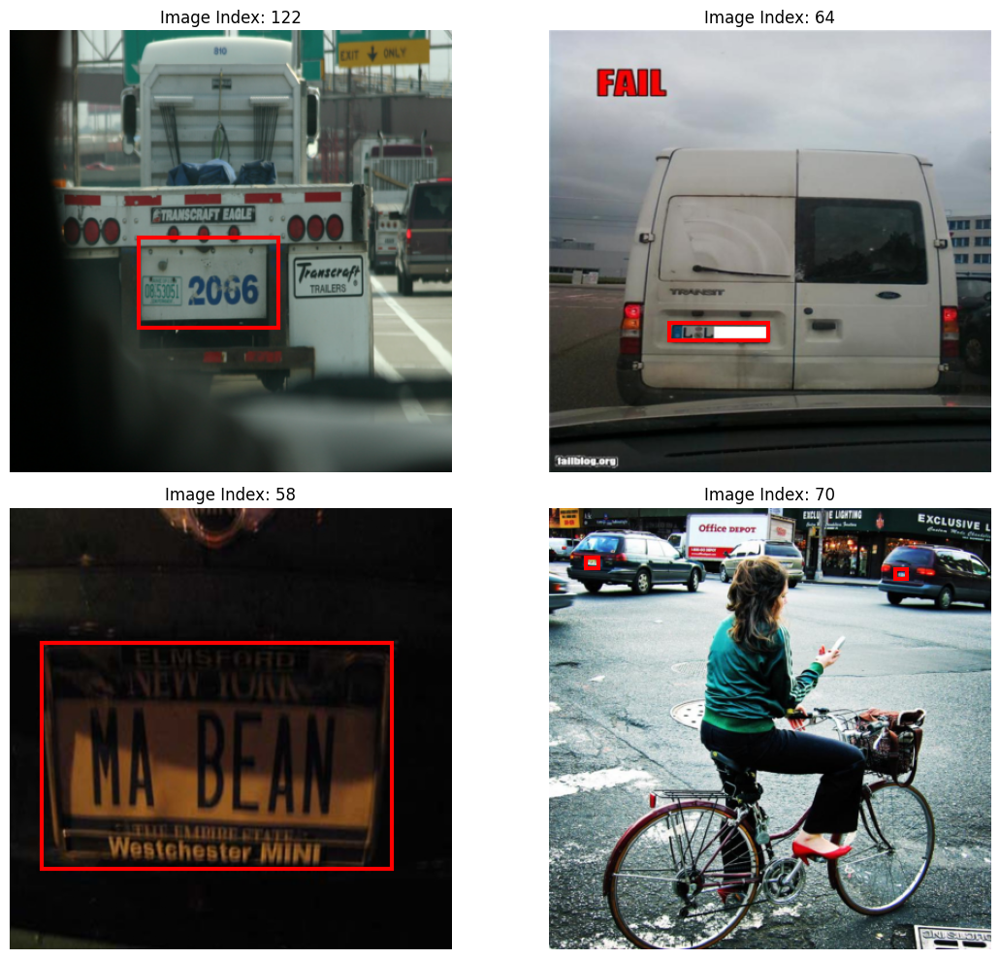

Test avec Conf=0.3 et NMS=0.6
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])


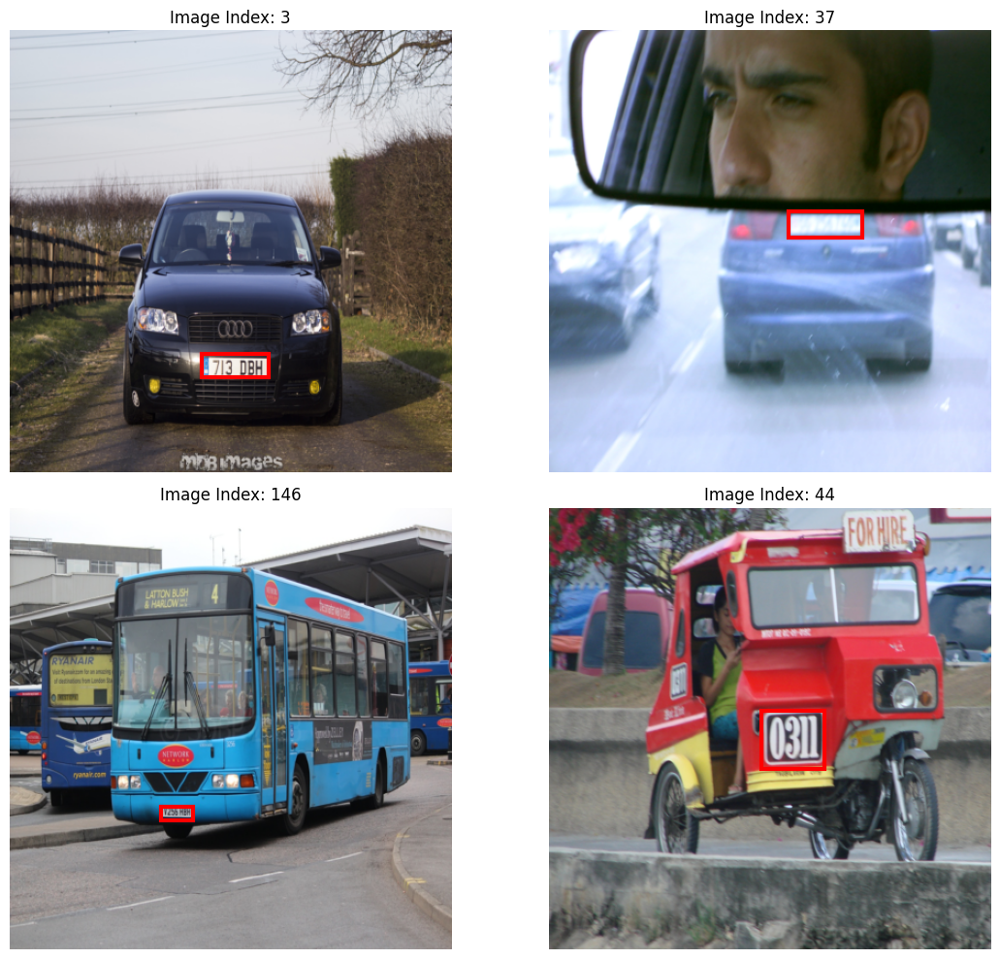

Test avec Conf=0.5 et NMS=0.2
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])


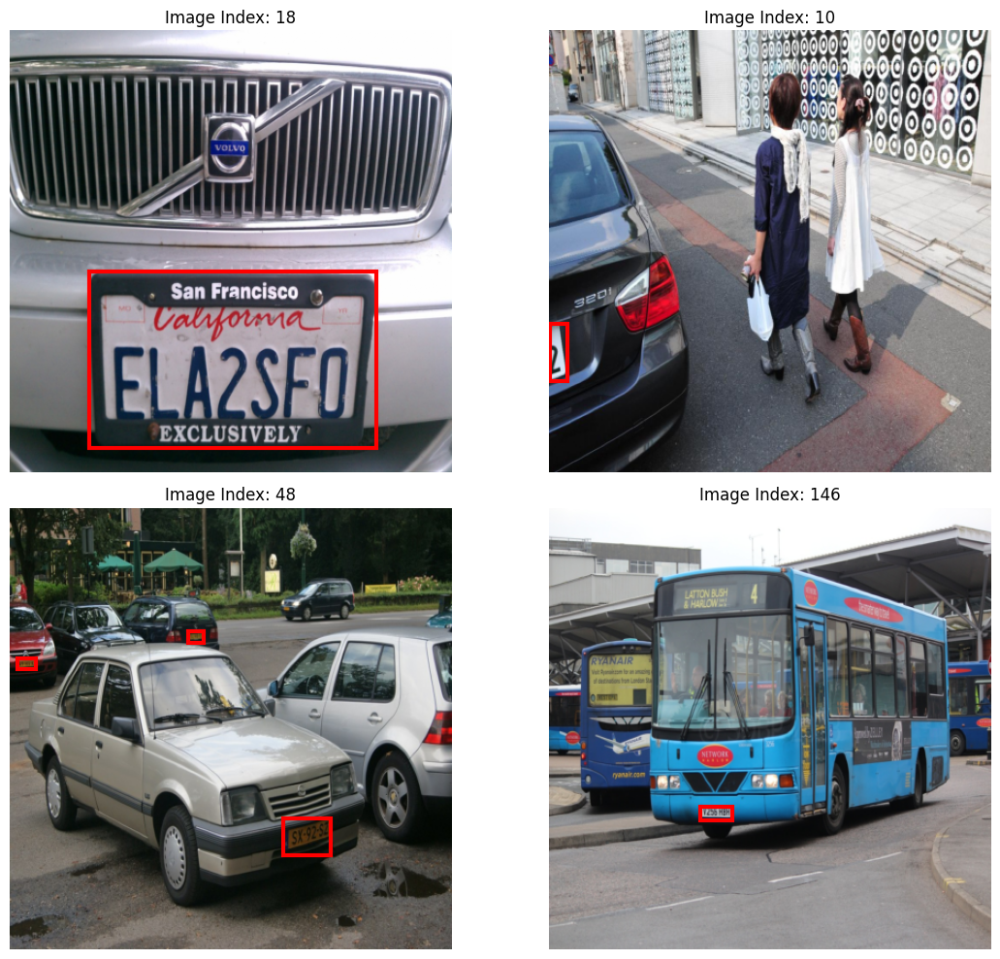

Test avec Conf=0.5 et NMS=0.45
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])


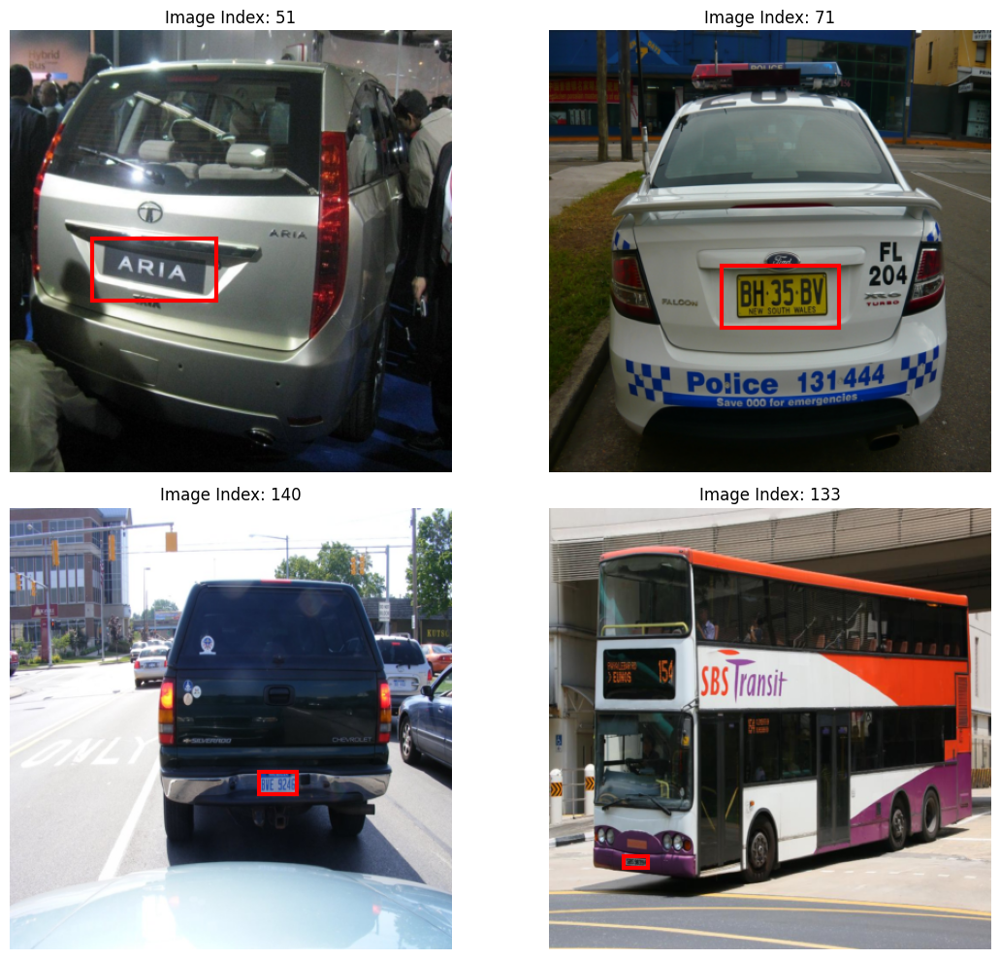

Test avec Conf=0.5 et NMS=0.6
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])


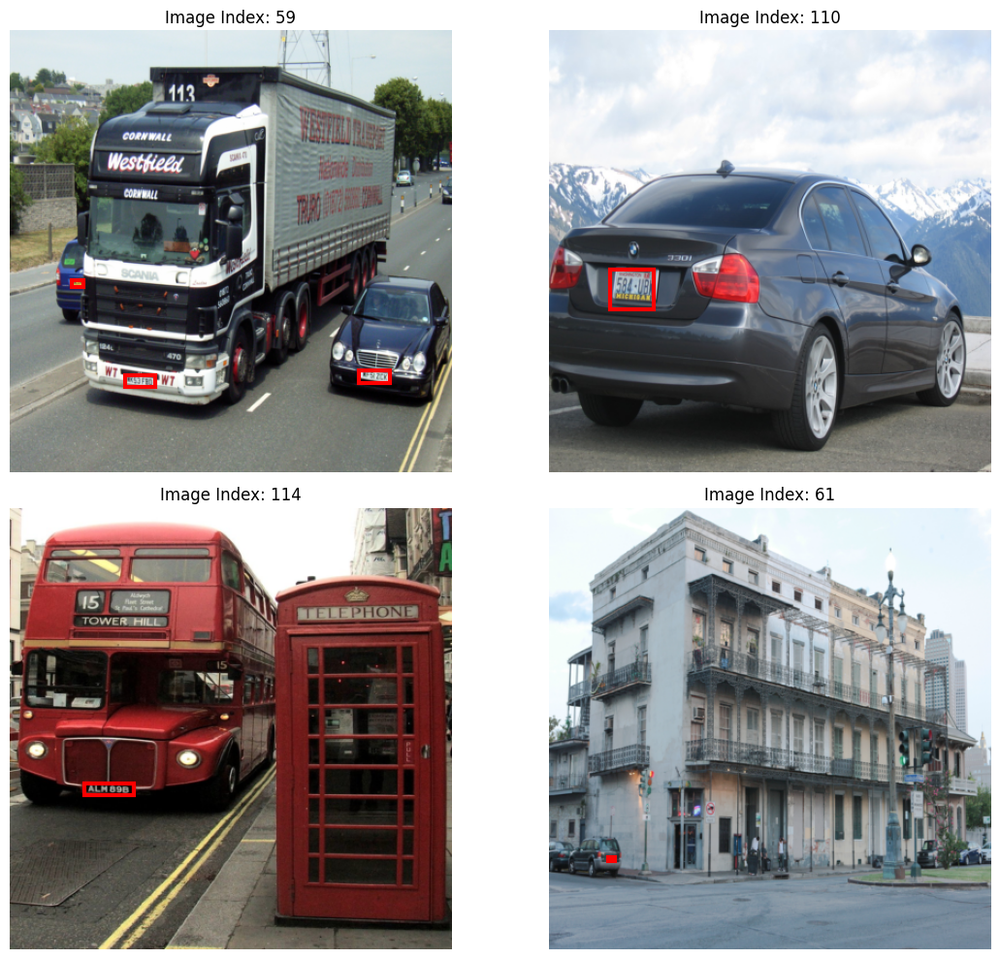

In [22]:
#tuning

# Liste des valeurs à tester
thresholds = [0.1, 0.3, 0.5]
nms_values = [0.2, 0.45, 0.6]

for t in thresholds:
    for n in nms_values:
        print(f"Test avec Conf={t} et NMS={n}")
        # Tu appelles ta fonction de visualisation ou de calcul d'IoU
        show_results(val_ds, model, conf_thresh=t)

In [23]:
def compute_final_miou(model, dataloader, S=13):
    model.eval()
    all_ious = []
    
    print("Calcul du mIoU moyen sur le jeu de validation...")
    
    with torch.no_grad():
        for imgs, labels in dataloader:
            imgs = imgs.to(device)
            preds = model(imgs).cpu()
            targets = labels.cpu()
            
            # Pour chaque image du batch
            for b in range(preds.shape[0]):
                # Décodage de la meilleure prédiction
                p_boxes, p_scores, _ = decode_yolo_grid(preds[b], S=S, is_target=False)
                # Décodage de la vérité terrain
                gt_boxes, _, _ = decode_yolo_grid(targets[b], S=S, is_target=True)
                
                if len(gt_boxes) > 0 and len(p_boxes) > 0:
                    # On prend la prédiction avec le score le plus haut
                    best_p_idx = torch.argmax(p_scores)
                    current_iou = iou(p_boxes[best_p_idx], gt_boxes[0])
                    all_ious.append(current_iou.item() if torch.is_tensor(current_iou) else current_iou)
                elif len(gt_boxes) > 0:
                    # La plaque existe mais n'a pas été trouvée du tout
                    all_ious.append(0.0)

    final_score = sum(all_ious) / len(all_ious) if all_ious else 0
    print(f"🏆 mIoU Final sur la Validation : {final_score:.4f}")
    return final_score

# Exécution du calcul
final_miou_score = compute_final_miou(model, val_loader, S=13)

Calcul du mIoU moyen sur le jeu de validation...
torch.Size([64, 13, 13, 6])
torch.Size([64, 13, 13, 6])
torch.Size([22, 13, 13, 6])
🏆 mIoU Final sur la Validation : 0.0000


#### Results on test_set 

### 5. Results and Final Evaluation
#### 5.1 Final Inference on Test Set
final_test_miou = compute_final_miou(model, test_loader)

#### 5.2 Qualitative Results (Test Images)
show_results(test_ds, model, num_images=6, conf_thresh=0.3)

### Video tracking (frame per frame analysis)

In [34]:
# separate the frame of a video into images and save them in a folder

def video_to_frames(video_path, output_folder, frame_rate=1):
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    cap = cv2.VideoCapture(video_path)
    count = 0
    saved_count = 0

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        if count % frame_rate == 0:
            frame_filename = os.path.join(output_folder, f"frame_{saved_count:05d}.jpg")
            cv2.imwrite(frame_filename, frame)
            saved_count += 1

        count += 1

    cap.release()
    print(f"Extraction terminée. {saved_count} images sauvegardées dans '{output_folder}'.")

In [35]:
# apply the function on a sample video Timothée took with his friend Tristan

video_path = "../video/voiture_tristan.mp4"
output_folder = "../video/video_frames"

video_to_frames(video_path, output_folder)  

Extraction terminée. 151 images sauvegardées dans '../video/video_frames'.


In [36]:
# trim the images to 416x416 size and centered crop and save them in another folder

def crop_images_to_416(input_folder, output_folder):
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    for img_name in os.listdir(input_folder):
        if img_name.lower().endswith(('.jpg', '.jpeg', '.png')):
            img_path = os.path.join(input_folder, img_name)
            img = Image.open(img_path).convert("RGB")
            
            # Center crop to 416x416
            width, height = img.size
            new_size = 416
            left = (width - new_size) / 2
            top = (height - new_size) / 2
            right = (width + new_size) / 2
            bottom = (height + new_size) / 2
            
            img_cropped = img.crop((left, top, right, bottom))
            img_cropped.save(os.path.join(output_folder, img_name))

    print(f"Cropped images saved in '{output_folder}'.")

In [37]:
input_folder = "../video/video_frames"
output_folder = "../video/video_frames_cropped"
crop_images_to_416(input_folder, output_folder)

Cropped images saved in '../video/video_frames_cropped'.


In [38]:
import torch

def decode_yolo_pred(tensor, S=13, conf_thresh=0.4):
    """
    Décodage des prédictions YOLOv1 pour une image.
    
    Args:
        tensor: (S, S, 5+C) tensor de sortie du modèle
        S: taille de la grille
        conf_thresh: seuil minimal de confiance pour afficher une bbox
        
    Returns:
        boxes: list de [x_center, y_center, w, h] normalisé [0-1]
        scores: list des scores de confiance
        classes: list des indices de classes
    """
    boxes, scores, classes = [], [], []
    C = tensor.shape[-1] - 5

    for i in range(S):
        for j in range(S):
            cell = tensor[i, j]
            conf = torch.sigmoid(cell[4])  # objectness
            if conf < conf_thresh:
                continue

            px, py, pw, ph = cell[0:4]

            # Convertir x,y en coordonnées globales [0,1]
            gx = (j + torch.sigmoid(px)) / S
            gy = (i + torch.sigmoid(py)) / S
            w  = pw.clamp(0,1)
            h  = ph.clamp(0,1)

            cls_id = torch.argmax(cell[5:])
            boxes.append([gx.item(), gy.item(), w.item(), h.item()])
            scores.append(conf.item())
            classes.append(cls_id.item())

    return boxes, scores, classes


In [39]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

def show_pred_image(model, img_path, transform, S=13, IMG_SIZE=416, conf_thresh=0.4):
    """
    Applique le modèle sur une image et affiche les bboxes.
    
    Args:
        model: ton modèle YOLOv1
        img_path: chemin vers l'image
        transform: transformations (resize + ToTensor)
        S: taille de la grille
        IMG_SIZE: taille de l'image après transformation
        conf_thresh: seuil de confiance pour afficher une bbox
    """
    # Charger image
    img = Image.open(img_path).convert("RGB")
    img_tensor = transform(img).unsqueeze(0).to(next(model.parameters()).device)

    # Prediction
    model.eval()
    with torch.no_grad():
        pred = model(img_tensor)[0].cpu()

    boxes, scores, classes = decode_yolo_pred(pred, S=S, conf_thresh=conf_thresh)

    # Affichage
    fig, ax = plt.subplots(1, 1, figsize=(8, 8))
    ax.imshow(img)

    for box, score, cls in zip(boxes, scores, classes):
        x, y, w, h = box
        x0 = (x - w/2) * IMG_SIZE
        y0 = (y - h/2) * IMG_SIZE
        w0 = w * IMG_SIZE
        h0 = h * IMG_SIZE

        rect = patches.Rectangle((x0, y0), w0, h0, linewidth=2, edgecolor='lime', facecolor='none', linestyle='--')
        ax.add_patch(rect)
        ax.text(x0, y0, f"{score:.2f}", color='lime', fontsize=8, backgroundcolor='black')

    plt.title("Détection de Plaques sur l'Image")
    plt.axis('off')
    plt.show()


torch.Size([1, 13, 13, 6])


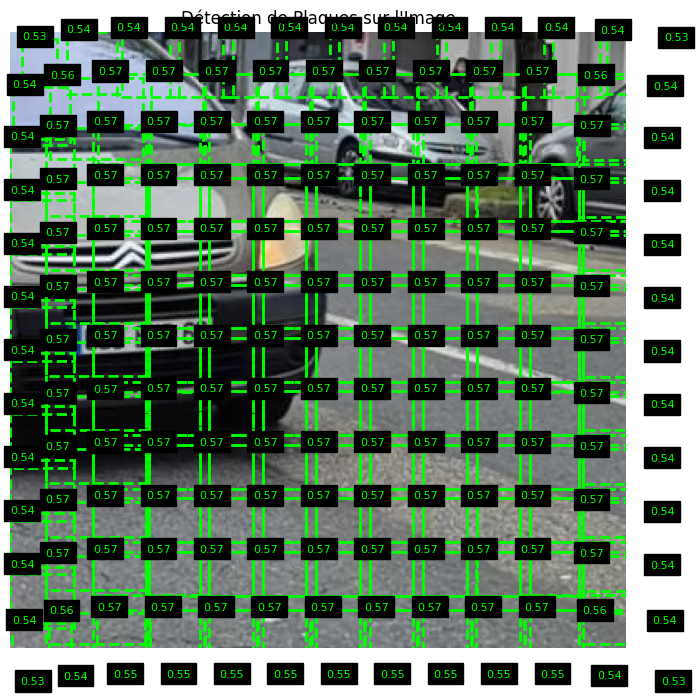

In [45]:
# Chemin vers la frame
frame_path = os.path.join(output_folder, "frame_00050.jpg")

# Affichage des prédictions
show_pred_image(
    model=model,
    img_path=frame_path,
    transform=my_transforms,   # ton pipeline de resize + ToTensor
    S=13,
    IMG_SIZE=416,
    conf_thresh=0.5           # tu peux ajuster à 0.3 ou 0.5 selon la qualité
)


In [46]:
# Apply the YOLO model on the cropped images and save the results with bounding boxes

def apply_yolo_on_images(input_folder, output_folder, model, transform, device, conf_thresh=0.3):
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    model.eval()

    for img_name in os.listdir(input_folder):
        img_path = os.path.join(input_folder, img_name)
        img = Image.open(img_path).convert("RGB")
        img_transformed = transform(img).unsqueeze(0).to(device)
        with torch.no_grad():
            pred = model(img_transformed)[0].cpu() 
        p_boxes, p_scores, p_classes = decode_yolo_grid(pred, S=13, is_target=False)
        mask = p_scores > conf_thresh
        p_boxes, p_scores, p_classes = p_boxes[mask], p_scores[mask], p_classes[mask]
        keep = apply_nms(p_boxes, p_scores)
        p_boxes, p_scores, p_classes = p_boxes[keep], p_scores[keep], p_classes[keep]
        fig, ax = plt.subplots(1)
        ax.imshow(img)

        for box, sc in zip(p_boxes, p_scores):
            x, y, w, h = box
            x0 = (x - w/2) * img.width
            y0 = (y - h/2) * img.height
            w0 = w * img.width
            h0 = h * img.height

            rect = patches.Rectangle((x0, y0), w0, h0, linewidth=2, edgecolor='lime', facecolor='none', linestyle='--')
            ax.add_patch(rect)
            ax.text(x0, y0, f"{sc:.2f}", color='lime', fontsize=8, backgroundcolor='black')
        plt.axis('off')
        plt.savefig(os.path.join(output_folder, img_name), bbox_inches='tight', pad_inches=0)
        plt.close()
    print(f"Processed images saved in '{output_folder}'.")

In [47]:
input_folder = "../video/video_frames_cropped"
output_folder = "../video/video_frames_yolo"
apply_yolo_on_images(input_folder, output_folder, model, my_transforms, device, conf_thresh=0.3)

torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])
torch.Size([1, 13, 13, 6])
t

In [48]:
# reconstruct the video from the processed frames

def frames_to_video(input_folder, output_video_path, fps=10):
    frame_files = sorted([f for f in os.listdir(input_folder) if f.lower().endswith(('.jpg', '.jpeg', '.png'))])
    if not frame_files:
        print("Aucune image trouvée dans le dossier spécifié.")
        return

    first_frame = cv2.imread(os.path.join(input_folder, frame_files[0]))
    height, width, layers = first_frame.shape

    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    video = cv2.VideoWriter(output_video_path, fourcc, fps, (width, height))

    for frame_file in frame_files:
        frame_path = os.path.join(input_folder, frame_file)
        frame = cv2.imread(frame_path)
        video.write(frame)

    video.release()
    print(f"Vidéo créée avec succès : '{output_video_path}'.")

In [49]:
input_folder = "../video/video_frames_yolo"
output_video_path = "../video/yolo_detected_video.mp4"

frames_to_video(input_folder, output_video_path, fps=10)

Vidéo créée avec succès : '../video/yolo_detected_video.mp4'.
